<a href="https://colab.research.google.com/github/theaok/gisPy/blob/main/folium.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**interactive fun fun**:  map on its own in javaScript/html-- opens in webbrowser :)

like google maps with detailed basemap--great for:

-mapping at low level like neighborhoods, blocks, streets

-sharing with others



In [ ]:
%%capture
!pip install mapclassify
import mapclassify

In [ ]:
import time, webbrowser, zipfile

import pandas as pd
import geopandas as gpd

from google.colab import data_table
data_table.enable_dataframe_formatter()

from google.colab import files #to download from colab onto hd

import folium as f
from folium.plugins import MarkerCluster, HeatMap

#will display all output not just last command
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [ ]:
f.__version__

'0.20.0'

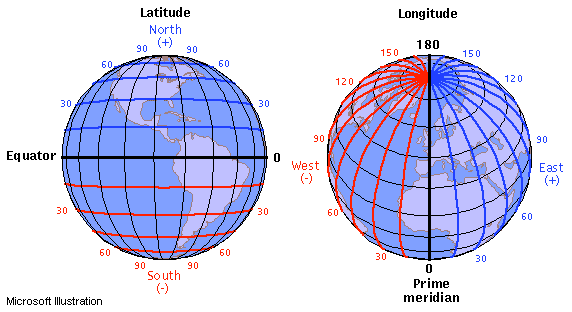

### plotly [skip]

https://plotly.com/python/choropleth-maps/

its kinda in between gpd and folium--more clickable and interactive than gpd, yet not using fully fledged online map interface like folium/leafmap, so we just skip it as the worst of the both worlds (static gpd v interactive folium)

note we used plotly ealier under gpd notebook for regular visualizations like scatterplot and treemap


### [oct23] folium

its been around for some time, stable, no issues


https://geopandas.org/en/stable/gallery/plotting_with_folium.html

https://geopandas.org/en/stable/gallery/polygon_plotting_with_folium.html

https://python-visualization.github.io/folium/latest/user_guide.html

In [ ]:
#as of 2026 gpd can do leaflet!

#Interactive Visualization (explore): Native interactive mapping with leafet.js, allowing tooltips, popups, and basemaps.
njC.explore(column="POP2010", tooltip=True)

TODO add more bells and whistles!

In [ ]:
#note can put lat and long into google maps too
m=f.Map(location=[40, -75]) #open street map osm is default
#m.save('m.html')
#files.download('m.html')
#webbrowser.get('firefox').open_new_tab('m.html') #; webbrowser.open('m.html')

#### geocoding

remember we did earlier in gpd, here just repeating

In [ ]:
#from geopandas.tools import geocode
#! pip install geocoder
from geopy.geocoders import Nominatim
#if you do a lot of geocoding: https://developers.google.com/maps/documentation/geocoding/overview

#change email addr!! they will blcok you!
geolocator = Nominatim(user_agent='lala@gmail.com')
loc = geolocator.geocode("401 cooper st, camden nj 08102")
loc.address
loc[1]
#(location.latitude, location.longitude)



#another geocoder
#provider='photon' 'nominatim' and like 20 others #photon seems not exactly right, rather quite wrong
#loc2=gpd.tools.geocode("401 cooper st, camden nj 08102",provider='nominatim',
#                       user_agent='super adam', #adjust user agent to your name!
#                       timeout=4) #this seems to not be blocked too soon as of fa2024
#loc2
#loc2.geometry
#(loc2.geometry[0].y,loc2.geometry[0].x)
#f.Map(location=(loc2.geometry[0].y,loc2.geometry[0].x))

#gpd.tools.geocode(["boston, ma", "1600 pennsylvania ave. washington, dc"]

'401, Cooper Street, Downtown, Camden, Camden County, New Jersey, 08102, United States of America'

(39.9472224, -75.1220198)

In [ ]:
# do see many cool basemaps!: https://leaflet-extras.github.io/leaflet-providers/preview/
f.Map(location=loc[1], tiles='Cartodb Positron', zoom_start=16) #plain and white is good to show symbology on top
#f.Map(location=loc[1], tiles='OpenTopoMap', zoom_start=16)

In [ ]:
f.Map(location=loc[1], tiles='Cartodb dark_matter', zoom_start=12) #so is plain dark good to show symbology

In [ ]:
###adding markup by hand--easy! good for few u/a
m = f.Map(location=geolocator.geocode("401 cooper st, Camden nj 08102")[1], zoom_start=14) #center map here
#time.sleep(1)
f.Marker(geolocator.geocode("401 cooper st, Camden nj 08102")[1], popup='DPPA').add_to(m) #add baloon
#time.sleep(1)
f.Marker(geolocator.geocode("321 cooper st, Camden nj 08102")[1], popup='bbb').add_to(m) #another baloon
f.CircleMarker(geolocator.geocode("waterfront camden nj")[1], popup='waterfront').add_to(m) #now circle
#more cool options https://python-visualization.github.io/folium/latest/user_guide/vector_layers/circle_and_circle_marker.html
m.save('m.html') #and click on the left folder icon and download and open in webbrowser
m
#files.download('m.html')

In [ ]:
'''can pick:
icons:  http://www.w3schools.com/icons/bootstrap_icons_glyphicons.asp
colors: http://www.w3schools.com/colors/colors_names.asp
'''
m = f.Map(location=geolocator.geocode("401 cooper st camden nj")[1], zoom_start=10)
f.Marker(geolocator.geocode("401 cooper st camden nj")[1],
                     popup='i love this place!',icon = f.Icon(icon = 'cloud' ,color = 'green')).add_to(m)
f.CircleMarker(geolocator.geocode("2 Riverside Dr, Camden, NJ 08103")[1], popup='waterfront'
,color='#8A2BE2',fill_color='#F0F8FF').add_to(m)
#m.save('m8.html')
m

'can pick\nicons:  http://www.w3schools.com/icons/bootstrap_icons_glyphicons.asp  and\ncolors: http://www.w3schools.com/colors/colors_names.asp\n'

#### many points

In [ ]:
aptPhi0=pd.read_excel('https://github.com/theaok/data/raw/main/apartments-for-rent.xls')
aptPhi0.head(3)
aptPhi0.columns

,Philadelphia Apartments,Property Overview,Phone Number,Address,City,State,Zip,Neighborhood,Map,Efficiency/Studios,...,Access Gates,Furnished,Cable-Ready,Short-term Available,Cats Allowed,Small Dogs Allowed,Large Dogs Allowed,Pets Negotiable,Wheelchair Accessible,URL
0,The Granary,All Floorplans,(215) 716-1675,1901 Callowhill St,Philadelphia,PA,19130,NaN,Map It,1,...,,,Yes,,,,,,,http://www.apartmenthomeliving.com/apartment-f...
1,Beacon Pointe Luxury Apartments,All Floorplans,(844) 627-2575,9503 State Rd,Philadelphia,PA,19114,NaN,Map It,1000,...,Yes,,Yes,,Yes,,,,,http://www.apartmenthomeliving.com/apartment-f...
2,Chestnut Hall Apartments,All Floorplans,(888) 775-4524,3900 Chestnut St,Philadelphia,PA,19104,NaN,Map It,1015,...,,,,,,,,,,http://www.apartmenthomeliving.com/apartment-f...


Index(['Philadelphia Apartments', 'Property Overview', 'Phone Number',
       'Address', 'City', 'State', 'Zip', 'Neighborhood', 'Map',
       'Efficiency/Studios', '1 Bedroom', '2 Bedroom', '3 Bedroom',
       '4 Bedroom', 'Lofts', 'Townhomes', 'Allows Pets', 'Air Conditioning',
       'Fitness Center', 'Parking', 'Pool(s)', 'Onsite Laundry',
       'Washer/Dryer in Unit', 'Washer/Dryer Hookups', 'Walk-in Closet',
       'Hardwood Floors', 'Wireless Internet', 'Garage', 'Access Gates',
       'Furnished', 'Cable-Ready', 'Short-term Available', 'Cats Allowed',
       'Small Dogs Allowed', 'Large Dogs Allowed', 'Pets Negotiable',
       'Wheelchair Accessible', 'URL'],
      dtype='object')

In [ ]:
aptPhi=aptPhi0.loc[0:3, ['Philadelphia Apartments','Address','City','State','Zip','1 Bedroom']] #just subset to 5 for faster geocoding
aptPhi

,Philadelphia Apartments,Address,City,State,Zip,1 Bedroom
0,The Granary,1901 Callowhill St,Philadelphia,PA,19130,1925
1,Beacon Pointe Luxury Apartments,9503 State Rd,Philadelphia,PA,19114,1185
2,Chestnut Hall Apartments,3900 Chestnut St,Philadelphia,PA,19104,1325
3,Vernon House,3226 Clifford St,Philadelphia,PA,19121,469
4,Walnut Terrace,401 W Walnut Ln,Philadelphia,PA,19144,740
5,NPDF - The Cornerstone,400 S 48th St,Philadelphia,PA,19143,700


In [ ]:
aptPhi['combined'] = aptPhi[['Address','City','State','Zip']].apply(lambda row: ' '.join(row.values.astype(str)), axis=1)
aptPhi

,Philadelphia Apartments,Address,City,State,Zip,1 Bedroom,combined
0,The Granary,1901 Callowhill St,Philadelphia,PA,19130,1925,1901 Callowhill St Philadelphia PA 19130
1,Beacon Pointe Luxury Apartments,9503 State Rd,Philadelphia,PA,19114,1185,9503 State Rd Philadelphia PA 19114
2,Chestnut Hall Apartments,3900 Chestnut St,Philadelphia,PA,19104,1325,3900 Chestnut St Philadelphia PA 19104
3,Vernon House,3226 Clifford St,Philadelphia,PA,19121,469,3226 Clifford St Philadelphia PA 19121
4,Walnut Terrace,401 W Walnut Ln,Philadelphia,PA,19144,740,401 W Walnut Ln Philadelphia PA 19144
5,NPDF - The Cornerstone,400 S 48th St,Philadelphia,PA,19143,700,400 S 48th St Philadelphia PA 19143


In [ ]:
#playing around to figure things out
#geolocator.geocode(aptPhi['combined'][0])[1]
#for i in aptPhi.index:
#  print(i)

m = f.Map(location=geolocator.geocode("philadelphia")[1], zoom_start=9)
for i in aptPhi.index:
  time.sleep(1)
  f.Marker(geolocator.geocode(aptPhi['combined'][i])[1], popup='1brm price: '+ aptPhi['1 Bedroom'][i].astype(str)).add_to(m)
#m.save('m7.html')
m

In [ ]:
m.save('m7.html')
files.download('m7.html')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##### [*] more convoluted way

turn to gpd, then list of lists and then map that with add_children

In [ ]:
aptPhi[['geometry','addrNom']] = geocode(aptPhi['combined'], provider='nominatim', user_agent='blah@gmail.com',timeout=2)

In [ ]:
aptPhi.head(2)

,Philadelphia Apartments,Address,City,State,Zip,1 Bedroom,combined,geometry,addrNom
0,The Granary,1901 Callowhill St,Philadelphia,PA,19130,1925,1901 Callowhill St Philadelphia PA 19130,POINT (-75.17069 39.96038),"1901, Callowhill Street, Center City, Philadel..."
1,Beacon Pointe Luxury Apartments,9503 State Rd,Philadelphia,PA,19114,1185,9503 State Rd Philadelphia PA 19114,POINT (-74.98335 40.04907),"Beacon Pointe, 9503, State Road, Delaire Landi..."


In [ ]:
gdf = gpd.GeoDataFrame(aptPhi, geometry='geometry') #, crs="EPSG:4326"
gdf.get_coordinates()
#gdf.plot()

,x,y
0,-75.170686,39.960382
1,-74.983350,40.049070
2,-75.200373,39.954985
3,-75.187552,39.983113
4,-75.187279,40.033068
5,-75.218480,39.952446


In [ ]:
lolR=gdf.get_coordinates().values.tolist()
#lolR
lol=[li[::-1] for li in lolR] #inverse elements in list

In [ ]:
m = f.Map(location=geolocator.geocode("philadelphia")[1], zoom_start=14)
m.add_children(MarkerCluster(locations=lol))
#m

<ipython-input-53-05ff4766ecf1>:2: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  m.add_children(MarkerCluster(locations=lol))


#### marker clusterer, heatmap

many points, clustering, USEFUL! fancy!

http://blog.dominodatalab.com/creating-interactive-crime-maps-with-folium/

we do sf, but there are nj data too for about $100:
https://force.nj.com/ (few years back student was able to get lat lon); and nj ag for free (down to municipality):
https://www.njoag.gov/force/ and data:
https://njoag.app.box.com/s/upgf6yyi9g0fyjg6ednhqmr69dg9crfh

<br>philly shootings
https://data.phila.gov/visualizations/shooting-victims

In [ ]:
!wget -q -O sfCrim.csv  https://raw.githubusercontent.com/devanshmanu/StravAdd/master/SFPD_Incidents_-_Current_Year__2015_.csv

sfCrim = pd.read_csv('sfCrim.csv')
len(sfCrim)

#sfCrim[1:3]
sfCrim=sfCrim[0:1000] #for speed purposes
sfCrim.head(3)

112331

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location
0,150827188,NON-CRIMINAL,"AIDED CASE, MENTAL DISTURBED",Sunday,09/20/2015,23:54,RICHMOND,UNFOUNDED,3000 Block of CLEMENT ST,-122.491851,37.781756,"(37.7817557255921, -122.491851328976)"
1,150827213,ASSAULT,INFLICT INJURY ON COHABITEE,Sunday,09/20/2015,23:45,INGLESIDE,"ARREST, BOOKED",100 Block of LOEHR ST,-122.413676,37.712617,"(37.7126165766239, -122.413676487435)"
2,150827213,ASSAULT,ATTEMPTED HOMICIDE WITH A KNIFE,Sunday,09/20/2015,23:45,INGLESIDE,"ARREST, BOOKED",100 Block of LOEHR ST,-122.413676,37.712617,"(37.7126165766239, -122.413676487435)"


In [ ]:
#create empty map zoomed in on San Francisco
m = f.Map(location=(37.76, -122.45), zoom_start=12)

loc = []
#add a marker for every record
for each in sfCrim.iterrows():
    loc.append([each[1]['Y'],each[1]['X']])

loc[0:3] #just print first 3 to have a look

m.add_children(MarkerCluster(locations=loc)) #use a clustered view
#m.save('m10.html')
#very cool! hover over it--pups u in blue a polygon that the aggregate refers to!

[[37.7817557255921, -122.491851328976],
 [37.7126165766239, -122.413676487435],
 [37.7126165766239, -122.413676487435]]

/tmp/ipython-input-4090229839.py:11: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  m.add_children(MarkerCluster(locations=loc)) #use a clustered view


In [ ]:
#now with crim popup
sanfran_map = f.Map(location = [37.76, -122.45], zoom_start = 12)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = MarkerCluster().add_to(sanfran_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(sfCrim.Y, sfCrim.X, sfCrim.Category):
    f.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)

# display map
sanfran_map

In [ ]:
### heatmap http://www.jackboot7.com/visualizing-tweets.html
m = f.Map(location=(37.76, -122.45), zoom_start=12) #,width=1500,height=700
m.add_children(HeatMap(loc))

/tmp/ipython-input-2856069597.py:3: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  m.add_children(HeatMap(loc))


#### [nov13] polygons

folium works easily with geojson, can google for it just like you did with shapefiles eg "nj counties geojson", or gpd can export geojson

https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.to_json.html

or can just stick with gpd, see below 'ex: gpd: nj pop'

In [ ]:
#adding geojson
map = f.Map()
#map
f.GeoJson('https://raw.githubusercontent.com/datasets/geo-admin1-us/master/data/admin1-us.geojson').add_to(map)
map #see it's on the fly, ie leaflet loads geojson off the internet without downloading

##### [*] quick n dirty choloropleth: geojson+csv (skip bc no proper merge)

indeed, this often used setup is an example of how NOT to do it

In [ ]:
url = (
    "https://raw.githubusercontent.com/python-visualization/folium/master/examples/data"
)
state_geo = f"{url}/us-states.json"
state_unemployment = f"{url}/US_Unemployment_Oct2012.csv"
state_data = pd.read_csv(state_unemployment)

states = gpd.read_file(state_geo)
state_data.head(50)

,State,Unemployment
0,AL,7.1
1,AK,6.8
2,AZ,8.1
3,AR,7.2
4,CA,10.1
5,CO,7.7
6,CT,8.4
7,DE,7.1
8,FL,8.2
9,GA,8.8


In [ ]:
m = f.Map(location=[40, -95], zoom_start=4)
f.Choropleth(
    geo_data=state_geo, #geo data obj: state_geo
    name="choropleth", #not necessary
    data=state_data,   #regular data object
    columns=["State", "Unemployment"], # 1st var is join or merge var; 2nd is map var
    #KLUDGE: may not merge! first do a dry run to make sure everything merges fine: do see next example!!
    key_on="feature.id",  #this is merge/join var from geojson; just prefix ith 'feature
    fill_color="YlGnBu", #pick some color, opacities
    fill_opacity=0.7,
    line_opacity=.1,
    legend_name="Unemployment Rate (%)",
).add_to(m)

f.LayerControl().add_to(m)

#m #uncomment to see map
#m.save('m2.html')

#####  ex: countries eco footprint
elaboration: https://realpython.com/python-folium-web-maps-from-data/

In [ ]:
#https://en.wikipedia.org/wiki/List_of_countries_by_ecological_footprint

import requests #fake browswer
header = {
  "User-Agent": "Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/50.0.2661.75 Safari/537.36",
  "X-Requested-With": "XMLHttpRequest"
}

r=requests.get('https://en.wikipedia.org/wiki/List_of_countries_by_ecological_footprint', headers=header).text
pd.read_html(r,match='Biocapacity',flavor=None)[0].head(3)

/tmp/ipython-input-441494130.py:10: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  pd.read_html(r,match='Biocapacity',flavor=None)[0].head(3)


,Rank,Country/region,Ecological footprint,Biocapacity,Biocapacity deficit or reserve,Population (millions),Total biocapacity deficit or reserve (gMha),Population (millions) for biocapacity to equal ecological footprint*
,Rank,Country/region,(gha/person),(gha/person),(gha/person),Population (millions),Total biocapacity deficit or reserve (gMha),Population (millions) for biocapacity to equal ecological footprint*
0,NaN,World,2.75,1.63,-1.12,7753.00,-10400,2500.000000
1,1.0,Luxembourg,15.82,1.68,−14.14,0.63,−7.35,0.055221
2,2.0,Aruba,11.88,0.57,−11.31,0.17,−1.13,0.004798


In [ ]:
eco_footprints=pd.read_html(r,match='Biocapacity',flavor=None)[0]
eco_footprints['ecoFoo']=eco_footprints['Ecological footprint'].astype(float) #often need to convert to float
eco_footprints.columns = eco_footprints.columns.get_level_values(0) #bc there were 2 lev of cols
eco_footprints=eco_footprints[['Country/region','ecoFoo']]
eco_footprints

/tmp/ipython-input-1669293909.py:1: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  eco_footprints=pd.read_html(r,match='Biocapacity',flavor=None)[0]


,Country/region,ecoFoo
0,World,2.75
1,Luxembourg,15.82
2,Aruba,11.88
3,Qatar,10.80
4,Australia,9.31
...,...,...
185,Pakistan,0.79
186,Bangladesh,0.72
187,Haiti,0.61
188,Timor-Leste,0.48


In [ ]:
#m = f.Map(location=(30, 10), zoom_start=3, tiles="cartodb positron")
#f.GeoJson('http://geojson.xyz/naturalearth-3.3.0/ne_50m_admin_0_countries.geojson').add_to(m)
##m.save("footprint.html")
#m

! wget -q -O a.geojson 'http://geojson.xyz/naturalearth-3.3.0/ne_50m_admin_0_countries.geojson'
#! cat a.geojson
a0=gpd.read_file('a.geojson') #.head(3)
a=a0[['admin','geometry']]

In [ ]:
b=pd.merge(a,eco_footprints,left_on='admin',right_on='Country/region',indicator=True,how='outer')
b._merge.value_counts() #aha! error! need to fix it up!

,count
_merge,
both,175
left_only,66
right_only,15


In [ ]:
b[['admin', 'Country/region', 'ecoFoo', '_merge']] #have a good look what merged; without geometry column that has too much stuff

,admin,Country/region,ecoFoo,_merge
0,Afghanistan,Afghanistan,0.79,both
1,Aland,NaN,NaN,left_only
2,Albania,Albania,2.21,both
3,Algeria,Algeria,2.12,both
4,American Samoa,NaN,NaN,left_only
...,...,...,...,...
251,Western Sahara,NaN,NaN,left_only
252,NaN,World,2.75,right_only
253,Yemen,Yemen,1.03,both
254,Zambia,Zambia,0.99,both


In [ ]:
#b[['admin',"Country/region", "ecoFoo",'_merge']] #ok mostly small places, just fix up the us
eco_footprints2=eco_footprints
eco_footprints2['Country/region'].replace('United States','United States of America',inplace=True)
b=pd.merge(a,eco_footprints2,left_on='admin',right_on='Country/region',how='inner')
#always make a note whats up with nonmerges, eg:
#fixed US, other small places ~15 (right_only) ignored for now (value your time!)

/tmp/ipython-input-3311368925.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  eco_footprints2['Country/region'].replace('United States','United States of America',inplace=True)


In [ ]:
m = f.Map(location=(30, 10), zoom_start=3, tiles="cartodb positron")

max_eco_footprint = eco_footprints["ecoFoo"].max() #will use as upper boundary for legend

f.Choropleth(

    geo_data=b,
    data=b, #have to specify each separately; but we do merge first, so they both point to the same df

    columns=["Country/region", "ecoFoo"], #u/a and mapped var; u/a can also be 'admin'
    key_on="feature.properties.admin", #need to add beofre var: feature.properties.

    fill_color="RdYlGn_r", #gn yl rd is intuitive: good medium bad; sometimes need to reverse '_r'

    fill_opacity=0.8,
    line_opacity=0.3,
#important! be explicip about missing
    nan_fill_color="white",  #BUG doesnt work guess maybe nan coded differnt

    legend_name="Ecological footprint per capita; white=missing",
#FIXME alwasy define var as preceisely as possible, esp if unclear like here, eco footprint, eg could add say, kg of co2
    bins=[0, 1, 1.5, 2, 3, 4, 5, 6, 7, 8, max_eco_footprint],
#FIXME there is too big spread on top bin 8-16!
    #or can do jenks-breaks etc--first make a map in gpd as always and then just set the same bins by hand here

).add_to(m)

#m #uncomment to see map

##### ex: gpd: nj pop
back to gpd and jersey!<br>

we started with gpd for a good reason: simple, stable, and versatile

and can stick with it here and use in folium (instead of more native geojson)

gpd df goes straightup into folium :) can easily take your gpd maps into folium

In [ ]:
! wget -q -O nj-counties.zip https://docs.google.com/uc?id=1xJDhcRCkgv7k4tNCa72Oog5bohV6dTB2&export=download
zip_ref = zipfile.ZipFile('nj-counties.zip', 'r'); zip_ref.extractall(); zip_ref.close()
njC0=gpd.read_file('nj_counties.shp')
njC=njC0[['COUNTY','COUNTY_LAB','POP2010','POPDEN2010','geometry']]

<Axes: >

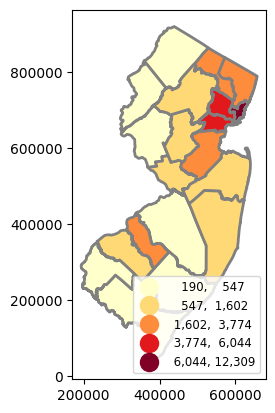

In [ ]:
#remember our first map?
njC.plot(column='POPDEN2010',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=5,
         edgecolor='grey',linewidth=2,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4})

In [ ]:
m = f.Map(location=[40, -75], zoom_start=8)

f.Choropleth(
    geo_data=njC,
    name="choropleth",
    data=njC,
    columns= ["COUNTY","POPDEN2010"],
    key_on="feature.properties.COUNTY", #need to add beofre var: feature.properties.
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,

    bins=[100, 550, 1500, 4000, 6000, 12000, 13000], #can make first gpd map and then use same or similar bins here
#still, histogram is the best to figure out best bins that "listen to the data"

    legend_name="Population Density By County (pers per sq mi?), 2010").add_to(m)

f.LayerControl().add_to(m)
#m #uncomment to see the map (for memory saving)
#!!!again simplify geo!!! these super detailed boundaries megabytes!
#note 100 and 550 overlap on scale: should do thousands of ppl, ie divide var by 1k

In [ ]:
# can do quantile like this; for others like natural breaks can do first in gpd and then use cutoffs by hand as above
bins = list(njC["POPDEN2010"].quantile([0, 0.25, 0.50, 0.75, 1]))
bins
#more ideas: https://vverde.github.io/blob/interactivechoropleth.html

[190.0, 340.0, 1023.0, 2527.0, 12309.0]

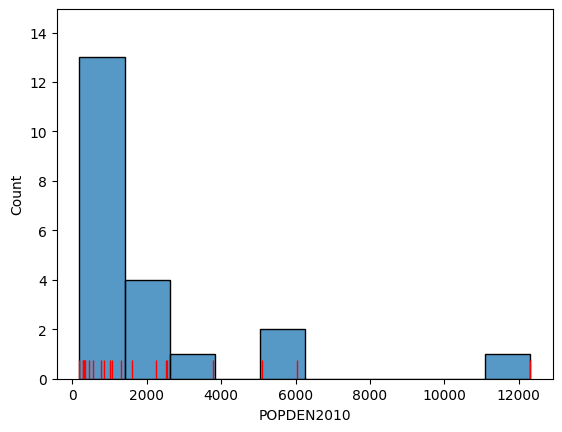

In [ ]:
import seaborn as sns
ax = sns.histplot(njC["POPDEN2010"], bins=10)
sns.rugplot(njC["POPDEN2010"], height=0.05, color="red", ax=ax);

#njC.POP2010.describe()
#njC.POP2010.hist(bins=20)
#ax = sns.histplot(njC["POPDEN2010"], bins=20)
#sns.rugplot(njC["POPDEN2010"], height=0.05, color="red", ax=ax);

In [ ]:
## multiple layers
m = f.Map(location=[40, -75], tiles='Cartodb Positron', zoom_start=8)

f.Choropleth(
    geo_data=njC,
    name="population density 2010",
    data=njC,
    columns= ["COUNTY","POPDEN2010"],
    key_on="feature.properties.COUNTY", #need to add beofre var: feature.properties.
    fill_color="YlOrRd",
    fill_opacity=1,
    line_opacity=0.3,
    bins=[100, 550, 1500, 4000, 6000, 12000, 13000],
    legend_name="Population Density By County (pers per sq mi?), 2010").add_to(m)

f.Choropleth(
    geo_data=njC,
    name="population size 2010",
    data=njC,
    columns= ["COUNTY","POP2010"],
    key_on="feature.properties.COUNTY", #need to add beofre var: feature.properties.
    fill_color="Blues",
    fill_opacity=1,
    line_opacity=0.3,
    bins=[50000, 200000, 400000, 700000, 1000000],
    legend_name="Population Size By County (persons, 2010").add_to(m)

#super simple just 2 maps and then just add:
f.LayerControl().add_to(m) #layer control button
#m #uncomment to see the map (for memory saving)

some hacks to make it better eg hide legends

https://github.com/it176131/Dynamic-Choropleth-Legends/blob/main/Dynamic%20Choropleth%20Legends.ipynb
works but little clunky, because at first all shown, only upon clicking they disappear

nice and fancy but new package/wrapper: folium helpers
https://andrewpwheeler.com/2023/04/25/hacking-folium-for-nicer-legends/

and then more ideas

https://stackoverflow.com/questions/74512212/how-to-hide-python-folium-choropleth-legend

https://github.com/python-visualization/folium/issues/956

https://github.com/python-visualization/folium/issues/1052

##### tooltip/popups

neat, cool functionality

https://vverde.github.io/blob/interactivechoropleth.html

https://towardsdatascience.com/folium-and-choropleth-map-from-zero-to-pro-6127f9e68564


<Axes: >

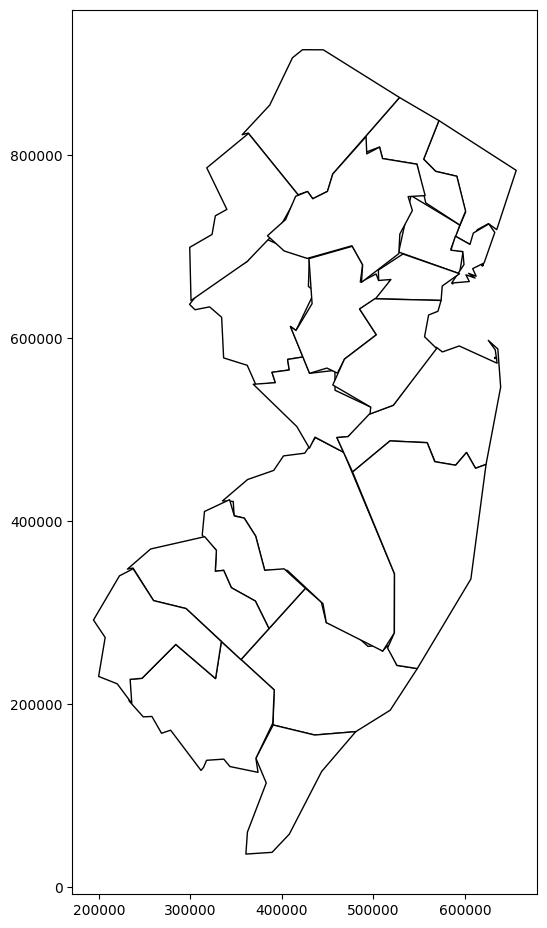

In [ ]:
njC1=njC.copy()
njC1['geometry'] = njC1.simplify(tolerance=5000) #huge difference like 1,000x with html map like 15kb v 15mb
njC1.plot(figsize=(6,12), color='white', edgecolor='black',linewidth=1)

In [ ]:
m = f.Map(location=[40, -75], zoom_start=8)

style_function = lambda x: {'fillColor': '#ffffff', #it makes it look cleaner without nasty default blue thick borders
                            'color':'#000000',
                            'fillOpacity': 0.1,
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', #it highlights polygon when hover over
                                'color':'#000000',
                                'fillOpacity': 0.50,
                                'weight': 0.1}
NIL = f.features.GeoJson(
    njC1,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=f.features.GeoJsonTooltip(
        fields=['COUNTY','POPDEN2010'],
        aliases=['county: ','pop den (pers per sq mi?): '],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;")
    )
)

f.Choropleth(
    geo_data=njC1,
    name="choropleth",
    data=njC1,
    columns= ["COUNTY","POPDEN2010"],
    key_on="feature.properties.COUNTY", #need to add beofre var: feature.properties.
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    bins=[100, 550, 1500, 4000, 6000, 12000, 15000],
    legend_name="Population Density By County (pers per sq mi?), 2010").add_to(m)

m.add_child(NIL)
#m.keep_in_front(NIL)
#f.LayerControl().add_to(m)
m.save('m.html')

In [ ]:
files.download('m.html') #may take like 5sec if original njC, not njC1; your os will probably prompt you to open in webbrowser, do it

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

great for consulting/make $:

since you have interactive vis in html/java script, put it on your website; you can get free website off github: https://www.google.com/search?q=github+host+website



and then upload the html there, i did in my github:
https://theaok.github.io/junk/m.html

and then you can embed it in another website with:

`<iframe id="igraph" scrolling="no" style="border:none;" seamless="seamless" src="https://theaok.github.io/junk/m.html" height="600" width="900"></iframe>`

as i did: https://theaok.github.io/junk/mm.html , and lets see page source

btw can also export interactive plotly html:
https://colab.research.google.com/github/theaok/vis/blob/main/plotly.ipynb

#### real world examples: chedvi and PR

https://github.com/theaok/c

https://theaok.github.io/c/
<br><br>

https://github.com/Venettov/Independent_Study_Class

https://venettov.github.io/Independent_Study_Class/

## <font color='red'> \>will be updated from here\> </font>

#### other examples

animated: covid in india, bus in nyc etc https://www.analyticsvidhya.com/blog/2020/06/guide-geospatial-analysis-folium-python/

#### draw

useful to create your own data :)

In [ ]:
from folium.plugins import Draw

m = f.Map()

Draw(export=True).add_to(m)

#hit export button in the map below to export (it downloads on your local hd)
m #before adding too much, make sure it exports and loads back ok;
  #eg i had issue with stuff (eg circle) didnt display--it may be mixing points with lines and polygons
  #better have one type only and export each as separate layer

In [ ]:
#then click folder icon on the left and upload data.geojson from local hd
map = f.Map()
f.GeoJson('data(3).geojson').add_to(map)
map

can also draw in https://www.google.com/maps/d/
lets check it out!

and can export/import in kml/kmz which can be converted with gpd: see gpd notebook sec 'I/O'


#### other plugins

In [ ]:
#fullscreen :0 actually very neat
m = f.Map(location=[41.9, -97.3], zoom_start=4)

f.plugins.Fullscreen(
    position="topright",
    title="Expand me",
    title_cancel="Exit me",
    force_separate_button=True,
).add_to(m)

m

and there's more--check out:
https://python-visualization.github.io/folium/latest/user_guide/plugins.html

you could have an extra credit presentation on some of those or sth else we didn't cover--email me

### [*] leafmap

fa24: nah, skip it; give it few more years to mature

just skim through quickly like 15min

we list it as 2nd to leaflet as it does require more dependencies; also may be more buggy

lots of great functionality; easy to use

also interactive! almost like full blown gis soft like qgis: eg click on the right the toolbox and can do a ton of stuff incl open attr table etc (may need additional libraries like ipysheet)

In [ ]:
!pip install leafmap
!pip install pycrs
!pip install osmnx
!pip install mapclassify

In [ ]:
#ton of dependencies; also saying here which for what not to get lost
import leafmap
import pycrs #may be needed for some imported data such as shapefiles
import geopandas #may be needed to for some files such a kml
import osmnx #for geocoding, eg we geocode camden
import mapclassify #for thematic maps

In [ ]:
#leafmap.basemaps.keys() #ton of possible basemaps

In [ ]:
m = leafmap.Map(
    #google_map="ROADMAP", # ROADMAP HYBRID #change basemap
    center=(40, -100), zoom=4, height="400px", width="800px",
    #draw_control=False, #turn off controls
    #measure_control=False,
    #fullscreen_control=False,
    #attribution_control=True,
    )
#m.to_html("mymap.html")
m

Map(center=[40, -100], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_t…

In [ ]:
#add geojson
m = leafmap.Map(center=[0, 0], zoom=2)
cou = "https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/countries.geojson"
cab = 'https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/cable_geo.geojson'
style = {
    "stroke": True,
    "color": "#0000ff",
    "weight": 2,
    "opacity": 1,
    "fill": True,
    "fillColor": "#0000ff",
    "fillOpacity": 0.1,
}
hover_style = {"fillOpacity": 0.7}
m.add_geojson(cou, layer_name="Countries", style=style, hover_style=hover_style)
m.add_geojson(cab, layer_name="Cable lines")
m

Map(center=[0, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text'…

In [ ]:
#add shapefile
m = leafmap.Map(center=[0, 0], zoom=2)
in_shp = 'https://github.com/giswqs/leafmap/raw/master/examples/data/countries.zip'
m.add_shp(in_shp, layer_name="Countries")
m


Downloading...
From: https://github.com/giswqs/leafmap/raw/master/examples/data/countries.zip
To: /tmp/countries.zip
100%|██████████| 132k/132k [00:00<00:00, 3.97MB/s]


Extracting files...


Map(center=[0, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text'…

In [ ]:
#add kml
m = leafmap.Map()
in_kml = 'https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/us_states.kml'
m.add_kml(in_kml, layer_name="US States KML")
m

Downloading...
From: https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/us_states.kml
To: /content/us_states.kml
95.4kB [00:00, 5.34MB/s]                   


Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [ ]:
#can add csv straightup as long as have x y
m = leafmap.Map()
df = pd.read_csv('https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/us_cities.csv') #pandas
m.add_points_from_xy(df, x="longitude", y="latitude")
m
###straight from csv file:
#m = leafmap.Map()
#data = 'https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/us_cities.csv'
#m.add_points_from_xy(data, x="longitude", y="latitude")
#m

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [ ]:
#heatmap
m = leafmap.Map()
in_csv = "https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/world_cities.csv"
m.add_heatmap(
    in_csv,
    latitude="latitude",
    longitude='longitude',
    value="pop_max",
    name="Heat map",
    radius=15, #play with radius to achieve desired heat
)
colors = ['blue', 'lime', 'red']
vmin = 0
vmax = 10000
m.add_colorbar(colors=colors, vmin=vmin, vmax=vmax)
m.add_title("World Population Heat Map", font_size="20px", align="center")
m

The ipyleaflet map does not support titles.


Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [ ]:
#thematic map
data = "https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/countries.geojson"
m = leafmap.Map()
m.add_data(
    data, column='POP_EST', scheme='Quantiles', cmap='Blues', legend_title='Population'
)
m
'''classification schemes:
BoxPlot
EqualInterval
FisherJenks
FisherJenksSampled
HeadTailBreaks
JenksCaspall
JenksCaspallForced
JenksCaspallSampled
MaxP
MaximumBreaks
NaturalBreaks
Quantiles
Percentiles
StdMean
UserDefined'''

'classification schemes:\nBoxPlot\nEqualInterval\nFisherJenks\nFisherJenksSampled\nHeadTailBreaks\nJenksCaspall\nJenksCaspallForced\nJenksCaspallSampled\nMaxP\nMaximumBreaks\nNaturalBreaks\nQuantiles\nPercentiles\nStdMean\nUserDefined'

In [ ]:
#geocode
m = leafmap.Map(toolbar_control=False, layers_control=True)
m.add_osm_from_geocode("Camden NJ", layer_name='Cam')
m

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [ ]:
#add census data
for key in leafmap.get_census_dict():
    print(key)

Current
ACS 2021
ACS 2019
ACS 2018
ACS 2017
ACS 2016
ACS 2015
ACS 2014
ACS 2013
ACS 2012
ECON 2012
Census 2020
Census 2010
Physical Features
Decennial Census 2020
Decennial Census 2010
Decennial Census 2000
Decennial Physical Features


In [ ]:
census_data_dict = leafmap.get_census_dict()
census_data_dict['Census 2020']['layers']

['Alaska_Native_Regional_Corporations10465',
 'Alaska_Native_Regional_Corporations_Labels60868',
 'Alaska_Native_Village_Statistical_Areas34178',
 'Alaska_Native_Village_Statistical_Areas_Labels14319',
 'American_Indian_Joint-Use_Areas11842',
 'American_Indian_Joint-Use_Areas_Labels32943',
 'Census_Block_Groups59805',
 'Census_Block_Groups_Labels32376',
 'Census_Blocks1978',
 'Census_Blocks_Labels63431',
 'Census_Designated_Places65166',
 'Census_Designated_Places_Labels61459',
 'Census_Divisions8578',
 'Census_Divisions_Labels29679',
 'Census_Regions16659',
 'Census_Regions_Labels31526',
 'Census_Tracts7651',
 'Census_Tracts_Labels33558',
 'Combined_New_England_City_and_Town_Areas35117',
 'Combined_New_England_City_and_Town_Areas_Labels20328',
 'Combined_Statistical_Areas61231',
 'Combined_Statistical_Areas_Labels52090',
 'Consolidated_Cities65047',
 'Consolidated_Cities_Labels30018',
 'Counties',
 'Counties_Labels19364',
 'County_Subdivisions63689',
 'County_Subdivisions_Labels25452'

In [ ]:
m = leafmap.Map(zoom=5,center=[40,-90])
m.add_census_data(wms="Census 2020", layer="States")
m.add_census_data(wms="Census 2020", layer="States_Labels49388")
m
#or in toolbox click 9th icon Get US Census Data; need to zoom; and may not work (i had issues with some)

Map(center=[40, -90], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_te…

In [ ]:
#vis land cover change #hit toolbar on the right, Layers, and turn on and off 2019
m = leafmap.Map(center=[36.1, -115.2],zoom=9)
m.add_basemap('NLCD 2001 CONUS Land Cover')
m.add_basemap('NLCD 2019 CONUS Land Cover')
m.add_legend(builtin_legend='NLCD')
m

Map(center=[36.1, -115.2], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_o…

In [ ]:
#lidar WONT RUN IN COLAB, need other interpreter; or maybe other backend
#https://leafmap.org/notebooks/48_lidar/
#!pip install laspy[lazrs,laszip]
#!pip install leafmap[lidar] open3d

In [ ]:
#url = 'https://github.com/giswqs/data/raw/main/lidar/madison.zip'
#filename = 'madison.las'
#if not os.path.exists(filename):
#    leafmap.download_file(url, 'madison.zip', unzip=True)

In [ ]:
#las = leafmap.read_lidar(filename)
#las.header


In [ ]:
#leafmap.view_lidar(filename, backend='open3d', background='white')